# Analysis of Colors Present in Fractal Artwork
## CS496 - Special Topics
### by Madison Tibbett


## Source of Data

All datasets were sourced from the author's own home computer. 

All artworks present and analyzed are property of Madison Tibbett, (c) 2010-2020. All artworks presented are protected under a Creative Commons Attribution-Noncommercial-No Derivative Works 3.0 License. You can read more about the licensing [here](https://creativecommons.org/licenses/by-nc-nd/3.0/).

All processing code for this project can be found on [GitHub](https://github.com/Esherymack/color-analyzer), where it is covered by the Unlicense. All artworks retain their Creative Commons licensing despite the Unlicense on the codebase.

The processing code is not included in this report due to the weight of processing the image data.

### Resources

* https://towardsdatascience.com/color-identification-in-images-machine-learning-application-b26e770c4c71
* https://www.dataquest.io/blog/tutorial-colors-image-clustering-python/
* https://realpython.com/python-opencv-color-spaces/

### Purpose of the project

I have been creating fractal artwork for over ten years now, and I was curious as to any particular trends in my use of color over the decade. I decided then to utilize a KMeans clustering algorithm to determine the most common colors in a given image, find the peak color, match it to a named color, and then classify it based on that color's color family. I then graphed the results. 

### Libraries used for processing:
For processing the data, I made use of several data-science specific libraries, including:
* [sklearn](https://scikit-learn.org/stable/)
* [matplotlib](https://matplotlib.org/)
* [numpy](https://numpy.org/)
* [opencv2](https://opencv.org/)
* [scikit-image](https://scikit-image.org/)

In [2]:
# The following magic is required to display graphs and charts
# inline with Jupyter.
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

# not necessary, but I enjoy fivethirtyeight styling over
# matplotlib default.
plt.style.use("fivethirtyeight")

### The first task

The first task in processing my images was to actually get a KMeans algorithm clustering colors in any given image. To do this, I opted to use the KMeans methods built-in to sklearn.

In order to open images, I used a for loop.

```py
 i = 0
    print(os.getcwd())
    for filename in os.listdir(image_data_directory):
        if filename.endswith(".jpg"):
            image = get_image(f'{image_data_directory}/{filename}')
            print("------------------------------")
            print(f"Input image: {filename}")
            print(f"Shape: {image.shape}")
        
            get_colors(image, 10, i)

            print("------------------------------")

            i+=1
```

Within the for loop, a function called `get_colors()` actually handles running the algorithm. This loop steps through a given directory and processes each image individually; I debated multithreading, but not only does sklearn's machine learning algorithms not work well with Python's built-in task managing library, it already seems to be mildly multithreaded as running the main work script used 50% of my computer's processing power. I also am a lazy programmer, and didn't feel like refactoring my code to be multithreaded after writing it.

The `get_colors()` method is as follows:

```py
def get_colors(image, ncolors, fname):
        # Resizing images to lessen pixel count,
        # which reduces the time needed to extract
        # colors from image.
        modified_image = cv2.resize(image, (600, 400), 
            interpolation = cv2.INTER_AREA)
        modified_image = modified_image.reshape
            (modified_image.shape[0] * modified_image.shape[1], 3)
        
        clf = KMeans(n_clusters = ncolors)
        labels = clf.fit_predict(modified_image)

        counts = Counter(labels)

        center_colors = clf.cluster_centers_

        ordered_colors = [center_colors[i] for i in counts.keys()]
        hex_colors = [RGB2HEX(ordered_colors[i]) for i in counts.keys()]
        rgb_colors = [ordered_colors[i] for i in counts.keys()]

        dictionary = dict(zip(hex_colors, counts.values()))

        dictionary = dict(sorted(dictionary.items(),
            key = operator.itemgetter(1), reverse = True))
        for k, v in dictionary.items():
            print(f"Color: {k}; Count: {v}")

        hexes = list(dictionary.keys())
        Peak(hexes[0], fname)

        plt.figure(figsize = (8, 6))
        plt.pie(counts.values(), labels=hex_colors, colors = hex_colors)
            
        plt.savefig(f"./analyzed2/piecharts/{fname}.jpg")
        plt.close()
        return rgb_colors
```

Within this function, the pie charts in the attached appendix are created. Each pie chart represents the *n* most common colors in a given image as selected by the KMeans algorithm. 

KMeans is a sort-of-random algorithm in that it will pick a relatively arbitrary location in the image and work from there. This means that there sometimes is a fluctuation in the actual counts of colors. While I was testing on a smaller dataset (1 to 5 images at a time), I noticed that the fluctuations would happen, but were relatively infrequent, which gave me confidence. However, to offset this slight statistical issue, I ran each test 5 times. This is reflected in the appendix.

### The second task

The second task after getting the most popular colours in an image was to find the "peak" color. This is a simple matter of picking the highest-counted color in the image. 

I then proceeded to match each "peak" color to a "named" color. The "named" colors were pulled from a massive list of color names and hex values found on Wikipedia. You can view these many lists [here](https://en.wikipedia.org/wiki/Lists_of_colors).

I simply did this for my own amusement. I like when colors have names.

```py
def Peak(peaked_color, fname):
    r = [int(hex[0:2], 16) for hex in hex_rgb_colors] 
    # Red elements
    g = [int(hex[2:4], 16) for hex in hex_rgb_colors] 
    # Green elements
    b = [int(hex[4:6], 16) for hex in hex_rgb_colors] 
    # Blue elements

    r = np.asarray(r, np.uint8)
    g = np.asarray(g, np.uint8)
    b = np.asarray(b, np.uint8)

    rgb = np.dstack((r, g, b))

    lab = rgb2lab(rgb)

    peaked_rgb = np.asarray([int(peaked_color[1:3], 16), 
    int(peaked_color[3:5], 16,), int(peaked_color[5:7], 
        16)], np.uint8)
    peaked_rgb = np.dstack((peaked_rgb[0], peaked_rgb[1], 
        peaked_rgb[2]))
    peaked_lab = rgb2lab(peaked_rgb)

    # Compute Euclidean distance
    lab_dist = ((lab[:,:,0] - peaked_lab[:,:,0])**2 + 
        (lab[:,:,1] - peaked_lab[:,:,1])**2 + (lab[:,:,2] - 
        peaked_lab[:,:,2])**2)**0.5

    # Get index of min distance
    min_index = lab_dist.argmin()

    # Get the hex string of the color with the minimum Euclidean distance 
    peaked_closest_hex = hex_rgb_colors[min_index]

    # Get the color name from the dictionary
    peaked_color_name = colors_dict[peaked_closest_hex]

    peaked_color_rgb = HEX2RGB(peaked_color)
    closest_match = HEX2RGB(list(colors_dict.keys())
        [list(colors_dict.values()).index(peaked_color_name)])

    print(f"Peaked color name: {peaked_color_name}")

    h, s, v = RGB2HSV(peaked_closest_hex)
    print(f"The top color is {peaked_color_name}. 
        Its HSV is {h}, {s}, {v}.")
    colorFamily = determinedColorFamily(h, s, v)
    print(f"The determined color family of 
        {peaked_color_name} is {colorFamily}")

    print(f"R: {peaked_color_rgb[0]}, G: 
        {peaked_color_rgb[1]}, B: {peaked_color_rgb[2]}")
    print(f"R: {closest_match[0]}, G: {closest_match[1]}, 
        B: {closest_match[2]}")

    fig, ax = plt.subplots(nrows=1, ncols=2)

    Z = np.vstack([peaked_color_rgb[0], peaked_color_rgb[1],
        peaked_color_rgb[2]])
    Y = np.vstack([closest_match[0], closest_match[1], 
        closest_match[2]])

    ax[0].set_title(f'Color from image: {peaked_color_rgb[0]}
        ,{peaked_color_rgb[1]},{peaked_color_rgb[2]}', fontsize=12)
    ax[0].imshow(np.dstack(Z), interpolation = 'none', aspect = 'auto')

    ax[1].set_title(f'Color matched to {closest_match[0]},
        {closest_match[1]},{closest_match[2]}', fontsize=12)
    ax[1].imshow(np.dstack(Y), interpolation = 'none', aspect = 'auto')

    fig.suptitle(f"Peaked color name: {peaked_color_name}", fontsize=16)

    ax[0].axis('off')
    ax[0].grid(b=None)
    ax[1].axis('off')
    ax[1].grid(b=None)
    plt.savefig(f"./analyzed2/peaks/{fname}.jpg")
    plt.close()
```

### The third task

The final task I wanted to accomplish was to actually count how many times a popular colour appeared over the entire dataset. I opted to use the HSV color space to figure this out.

Because each of my named colours has a known and consistent hex value, I decided to cluster those instead of the actual peak color. Judging from my own results, the peak color is typically "close enough" to the point that I feel comfortable in this decision.

To convert colors from the RGB colorspace to the HSV colorspace, I used the following algorithm:

```py
def RGB2HSV(color):
    r, g, b = HEX2RGB(color)

    # Convert RGB values to percentages
    r = r / 255
    g = g / 255
    b = b / 255

    # calculate a few basic values; the max of r, g, b, 
    # the min value, and the difference between the two (chroma)
    maxRGB = max(r, g, b)
    minRGB = min(r, g, b)

    chroma = maxRGB - minRGB
    
    # value (brightness) is easiest to calculate,
    # it's simply the highest value among the r, g, b components
    # multiply by 100 to turn the decimal into a percent
    computedValue = 100 * maxRGB

    # there's a special case for hueless (equal parts RGB make
    #    black, white, or grey)
    # note that hue is technically undefined when chroma is 0
    # as attempting to calc it would simply cause a division by 0
    #    error, so most applications
    # simply sub a hue of 0
    # Saturation will always be 0 in this case
    if chroma == 0:
        return 0, 0, computedValue

    # Saturation is also simple to compute, as it is chroma/value
    computedSaturation = 100 * (chroma/maxRGB)

    # Calculate hue
    # Hue is calculated via "chromacity" represented as a 
    #    2D hexagon, divided into six 60-deg sectors
    # we calculate the bisecting angle as a value 0 <= x < 6, 
    #    which represents which protion
    # of the sector the line falls on
    if r == minRGB:
        h = 3 - ((g - b) / chroma)
    elif b == minRGB:
        h = 1 - ((r - g) / chroma)
    else:
        h = 5 - ((b - r) / chroma)

    # After we have each sector position, we multiply it by 
    # the size of each sector's arc to obtain the angle in degrees
    computedHue = 60 * h

    return computedHue, computedSaturation, computedValue
```
The function returns a tuple that consists of the calculated hue, saturation, and value.

After this was acquired, I could then simply classify each color based on its HSV. I used the following HSV chart to help me match my named colors to a more general "color family."

![HSV chart](PKjgfFXm.png)

By using this chart, I was able to then construct a method that consists of an increasingly painful chain of if/else if statements to then tally each braod color family.

```py
def determinedColorFamily(hue, sat, val):
    if hue == 0 and sat == 0:
        if val >= 95:
            families_dict["white"] += 1
            return "white"
        elif 15 <= val < 95:
            families_dict["grey"] += 1
            return "grey"
        else:
            families_dict["black"] += 1
            return "black"
    elif 0 <= val < 15:
        families_dict["black"] += 1
        return "black"
    elif 99 <= val <= 100 and 0 <= sat < 5:
        families_dict["white"] += 1
        return "white"
    elif 5 <= sat <= 100:
        if 0 <= hue < 15:
            families_dict["red"] += 1
            return "red"
        elif 15 <= hue < 30:
            families_dict["warm red"] += 1
            return "warm red"
        elif 30 <= hue < 45:
            families_dict["orange"] += 1
            return "orange"
        elif 45 <= hue < 60:
            families_dict["warm yellow"] += 1
            return "warm yellow"
        elif 60 <= hue < 75:
            families_dict["yellow"] += 1
            return "yellow"
        elif 75 <= hue < 90:
            families_dict["cool yellow"] += 1
            return "cool yellow"
        elif 90 <= hue < 105:
            families_dict["yellow green"] += 1
            return "yellow green"
        elif 105 <= hue < 120:
            families_dict["warm green"] += 1
            return "warm green"
        elif 120 <= hue < 135:
            families_dict["green"] += 1
            return "green"
        elif 135 <= hue < 150:
            families_dict["cool green"] += 1
            return "cool green"
        elif 150 <= hue < 165:
            families_dict["green cyan"] += 1
            return "green cyan"
        elif 165 <= hue < 180:
            families_dict["warm cyan"] += 1
            return "warm cyan"
        elif 180 <= hue < 195:
            families_dict["cyan"] += 1
            return "cyan"
        elif 195 <= hue < 210:
            families_dict["cool cyan"] += 1
            return "cool cyan"
        elif 210 <= hue < 225:
            families_dict["blue cyan"] += 1
            return "blue cyan"
        elif 225 <= hue < 240:
            families_dict["cool blue"] += 1
            return "cool blue"
        elif 240 <= hue < 255:
            families_dict["blue"] += 1
            return "blue"
        elif 255 <= hue < 270:
            families_dict["warm blue"] += 1
            return "warm blue"
        elif 270 <= hue < 285:
            families_dict["violet"] += 1
            return "violet"
        elif 285 <= hue < 300:
            families_dict["cool magenta"] += 1
            return "cool magenta"
        elif 300 <= hue < 315:
            families_dict["magenta"] += 1
            return "magenta"
        elif 315 <= hue < 330:
            families_dict["warm magenta"] += 1
            return "warm magenta"
        elif 330 <= hue < 345:
            families_dict["red magenta"] += 1
            return "red magenta"
        elif 345 <= hue <= 360:
            families_dict["cool red"] += 1
            return "cool red"
    elif 0 <= sat < 5:
        families_dict["grey"] += 1
        return "grey"
```

### And that's pretty much it.

After all was said and done, I created another simple script which just took the saved data from each run and averaged each result. The final graph looks like this:

![Final data graph](./analyzed2/average_analysis.jpg)

And the final counts, since it may be a bit difficult to determine just from looking at the graph any exact numbers:

* White: 4
* Grey: 17
* Black: 91
* Red: 73
* Warm Red: 53
* Orange: 30
* Warm yellow: 12
* Yellow: 3
* Cool Yellow: 6
* Yellow Green: 6
* Warm Green: 0
* Green: 2
* Cool Green: 4
* Green Cyan: 7
* Warm Cyan: 5
* Cyan: 18
* Cool Cyan: 25
* Blue Cyan: 18
* Cool Blue: 14
* Blue: 5
* Warm Blue: 1
* Violet: 3
* Cool Magenta: 12
* Magenta: 4
* Warm Magenta: 5
* Red Magenta: 7
* Cool Red: 16

Overall, would I say I agree with these results? Yeah. I tend to use a lot of dark colours, and in my classifications I did cluster anything that I deemed "very very dark" to be "black." This is a general assumption that I feel many viewers may make.

## Appendix
The following code will generate images using matplotlib that hold the source image, each image's 5 pie charts, and each image's 5 peaks.

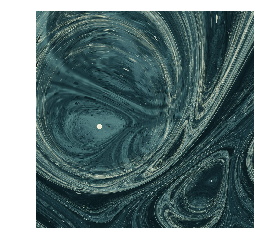

<Figure size 995x995 with 0 Axes>

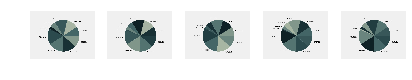

<Figure size 796x1990 with 0 Axes>

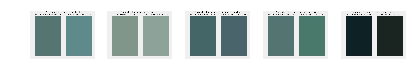

<Figure size 796x1990 with 0 Axes>

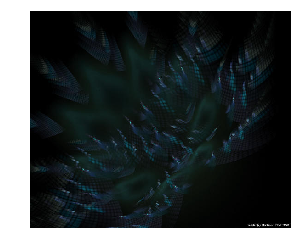

<Figure size 995x995 with 0 Axes>

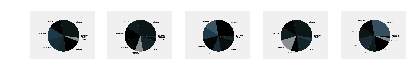

<Figure size 796x1990 with 0 Axes>

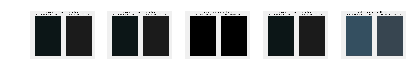

<Figure size 796x1990 with 0 Axes>

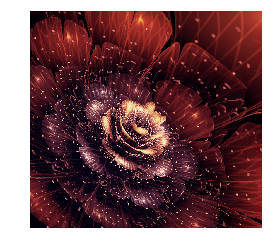

<Figure size 995x995 with 0 Axes>

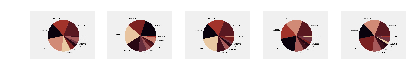

<Figure size 796x1990 with 0 Axes>

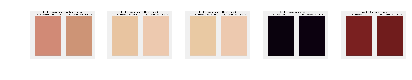

<Figure size 796x1990 with 0 Axes>

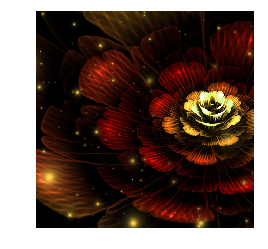

<Figure size 995x995 with 0 Axes>

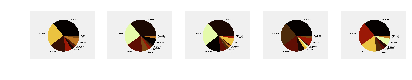

<Figure size 796x1990 with 0 Axes>

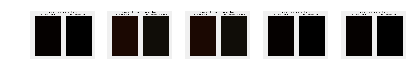

<Figure size 796x1990 with 0 Axes>

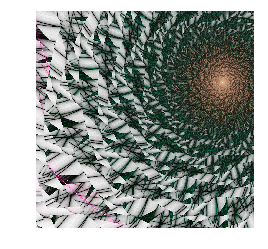

<Figure size 995x995 with 0 Axes>

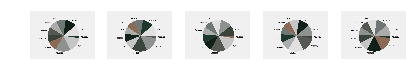

<Figure size 796x1990 with 0 Axes>

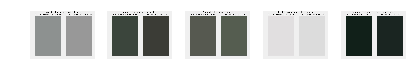

<Figure size 796x1990 with 0 Axes>

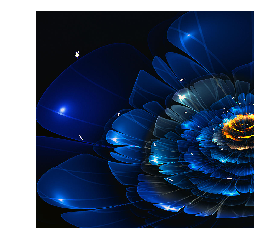

<Figure size 995x995 with 0 Axes>

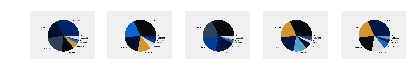

<Figure size 796x1990 with 0 Axes>

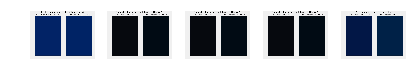

<Figure size 796x1990 with 0 Axes>

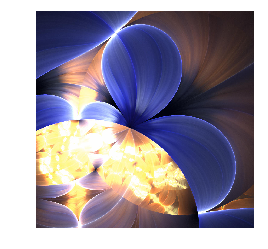

<Figure size 995x995 with 0 Axes>

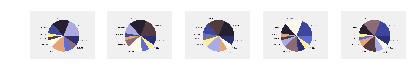

<Figure size 796x1990 with 0 Axes>

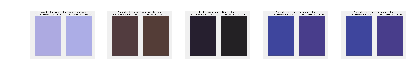

<Figure size 796x1990 with 0 Axes>

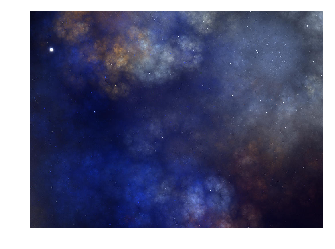

<Figure size 995x995 with 0 Axes>

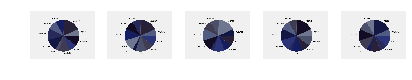

<Figure size 796x1990 with 0 Axes>

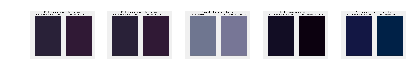

<Figure size 796x1990 with 0 Axes>

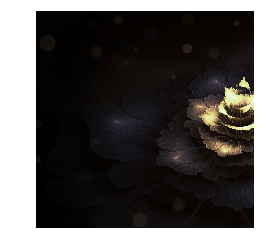

<Figure size 995x995 with 0 Axes>

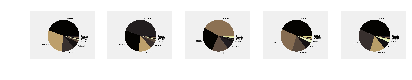

<Figure size 796x1990 with 0 Axes>

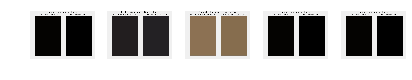

<Figure size 796x1990 with 0 Axes>

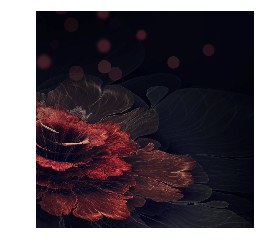

<Figure size 995x995 with 0 Axes>

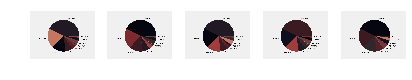

<Figure size 796x1990 with 0 Axes>

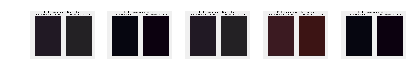

<Figure size 796x1990 with 0 Axes>

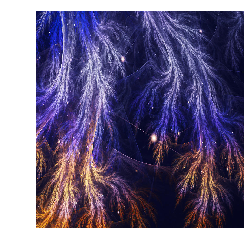

<Figure size 995x995 with 0 Axes>

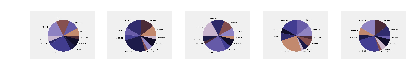

<Figure size 796x1990 with 0 Axes>

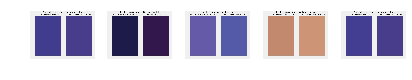

<Figure size 796x1990 with 0 Axes>

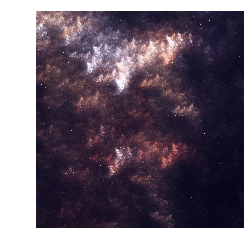

<Figure size 995x995 with 0 Axes>

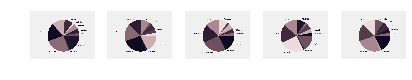

<Figure size 796x1990 with 0 Axes>

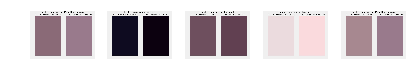

<Figure size 796x1990 with 0 Axes>

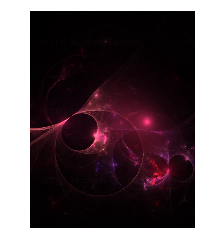

<Figure size 995x995 with 0 Axes>

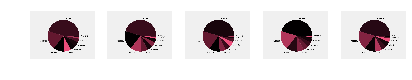

<Figure size 796x1990 with 0 Axes>

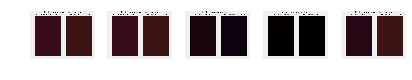

<Figure size 796x1990 with 0 Axes>

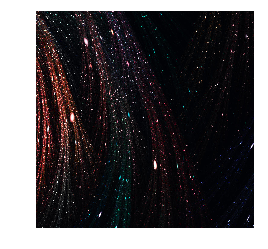

<Figure size 995x995 with 0 Axes>

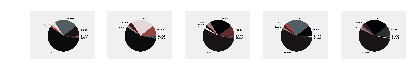

<Figure size 796x1990 with 0 Axes>

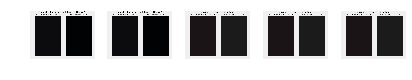

<Figure size 796x1990 with 0 Axes>

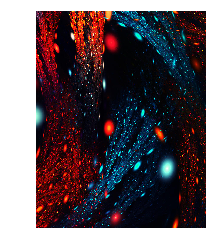

<Figure size 995x995 with 0 Axes>

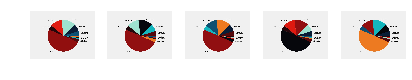

<Figure size 796x1990 with 0 Axes>

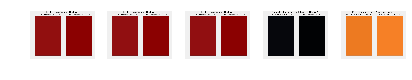

<Figure size 796x1990 with 0 Axes>

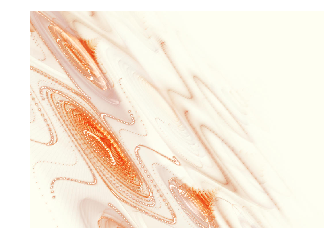

<Figure size 995x995 with 0 Axes>

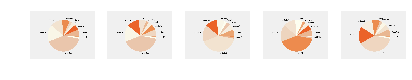

<Figure size 796x1990 with 0 Axes>

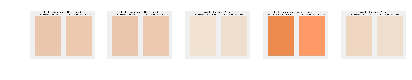

<Figure size 796x1990 with 0 Axes>

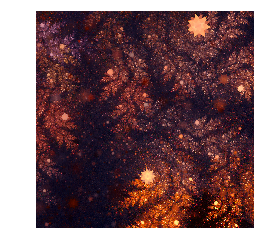

<Figure size 995x995 with 0 Axes>

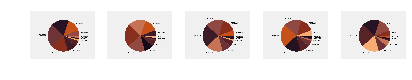

<Figure size 796x1990 with 0 Axes>

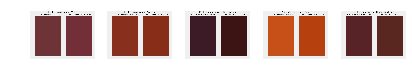

<Figure size 796x1990 with 0 Axes>

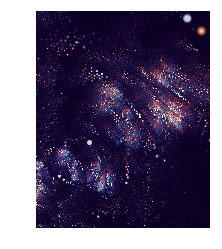

<Figure size 995x995 with 0 Axes>

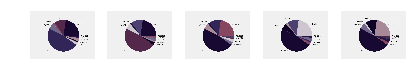

<Figure size 796x1990 with 0 Axes>

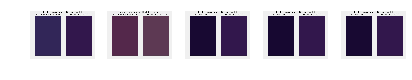

<Figure size 796x1990 with 0 Axes>

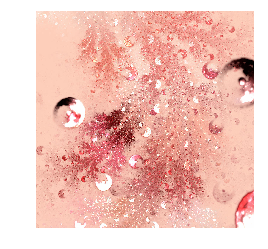

<Figure size 995x995 with 0 Axes>

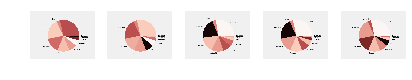

<Figure size 796x1990 with 0 Axes>

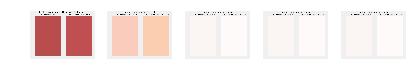

<Figure size 796x1990 with 0 Axes>

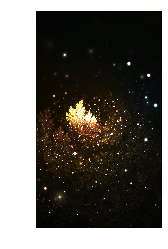

<Figure size 995x995 with 0 Axes>

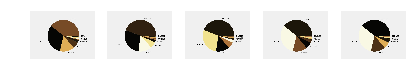

<Figure size 796x1990 with 0 Axes>

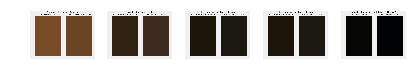

<Figure size 796x1990 with 0 Axes>

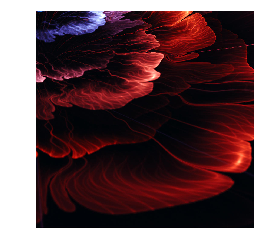

<Figure size 995x995 with 0 Axes>

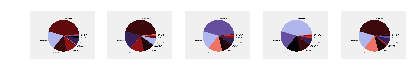

<Figure size 796x1990 with 0 Axes>

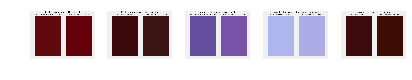

<Figure size 796x1990 with 0 Axes>

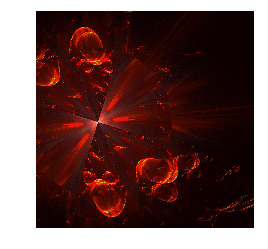

<Figure size 995x995 with 0 Axes>

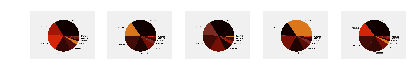

<Figure size 796x1990 with 0 Axes>

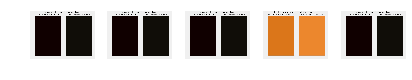

<Figure size 796x1990 with 0 Axes>

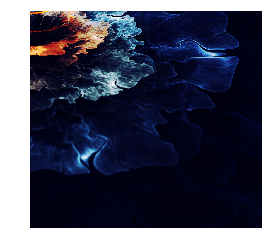

<Figure size 995x995 with 0 Axes>

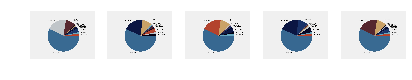

<Figure size 796x1990 with 0 Axes>

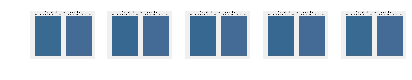

<Figure size 796x1990 with 0 Axes>

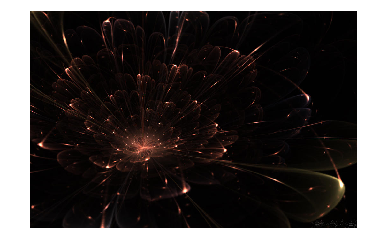

<Figure size 995x995 with 0 Axes>

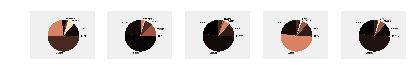

<Figure size 796x1990 with 0 Axes>

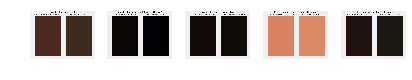

<Figure size 796x1990 with 0 Axes>

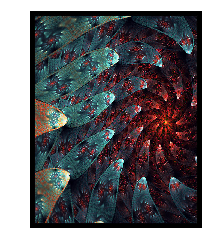

<Figure size 995x995 with 0 Axes>

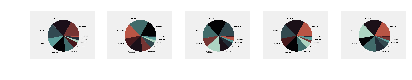

<Figure size 796x1990 with 0 Axes>

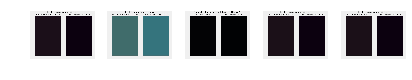

<Figure size 796x1990 with 0 Axes>

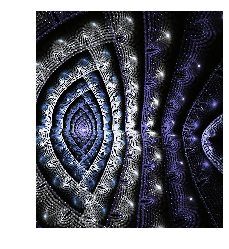

<Figure size 995x995 with 0 Axes>

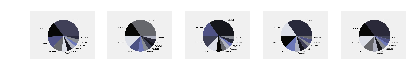

<Figure size 796x1990 with 0 Axes>

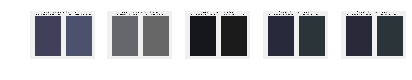

<Figure size 796x1990 with 0 Axes>

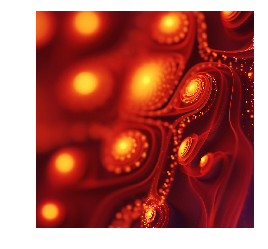

<Figure size 995x995 with 0 Axes>

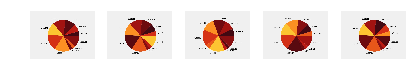

<Figure size 796x1990 with 0 Axes>

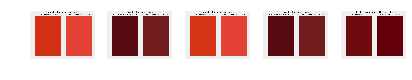

<Figure size 796x1990 with 0 Axes>

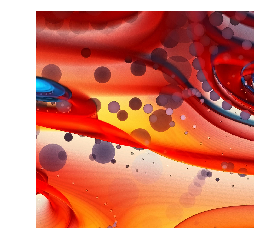

<Figure size 995x995 with 0 Axes>

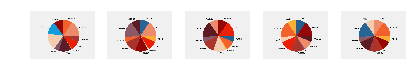

<Figure size 796x1990 with 0 Axes>

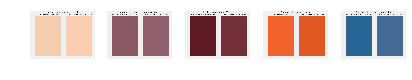

<Figure size 796x1990 with 0 Axes>

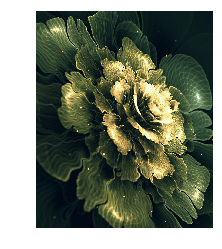

<Figure size 995x995 with 0 Axes>

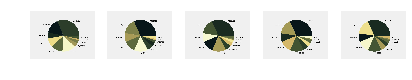

<Figure size 796x1990 with 0 Axes>

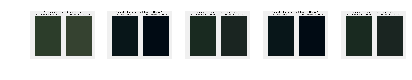

<Figure size 796x1990 with 0 Axes>

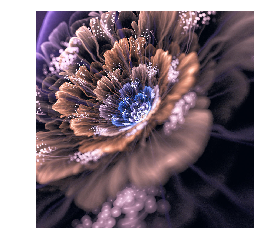

<Figure size 995x995 with 0 Axes>

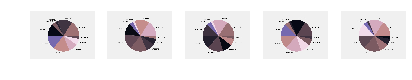

<Figure size 796x1990 with 0 Axes>

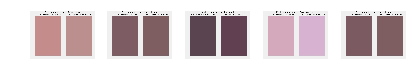

<Figure size 796x1990 with 0 Axes>

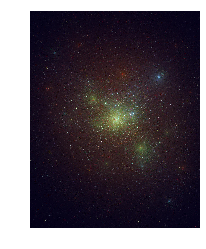

<Figure size 995x995 with 0 Axes>

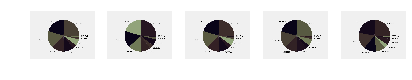

<Figure size 796x1990 with 0 Axes>

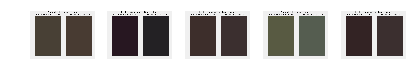

<Figure size 796x1990 with 0 Axes>

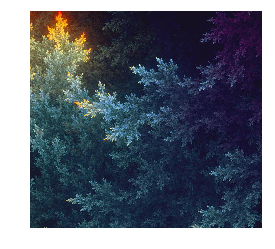

<Figure size 995x995 with 0 Axes>

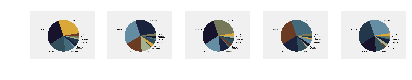

<Figure size 796x1990 with 0 Axes>

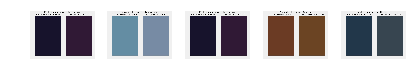

<Figure size 796x1990 with 0 Axes>

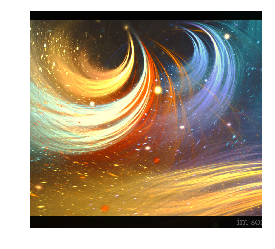

<Figure size 995x995 with 0 Axes>

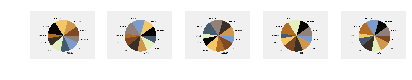

<Figure size 796x1990 with 0 Axes>

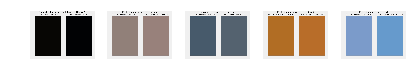

<Figure size 796x1990 with 0 Axes>

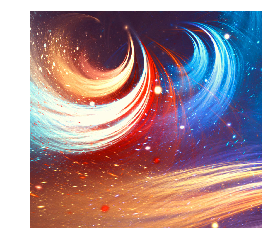

<Figure size 995x995 with 0 Axes>

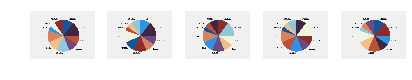

<Figure size 796x1990 with 0 Axes>

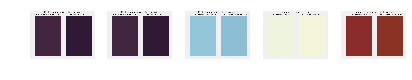

<Figure size 796x1990 with 0 Axes>

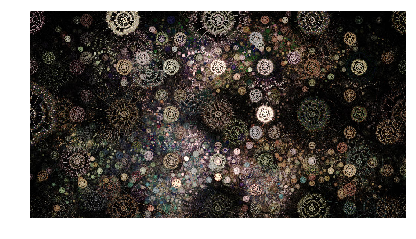

<Figure size 995x995 with 0 Axes>

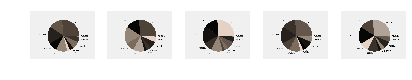

<Figure size 796x1990 with 0 Axes>

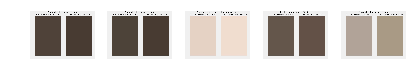

<Figure size 796x1990 with 0 Axes>

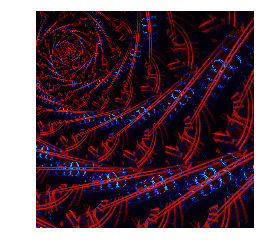

<Figure size 995x995 with 0 Axes>

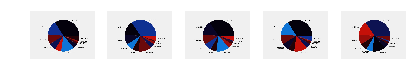

<Figure size 796x1990 with 0 Axes>

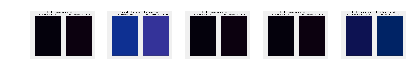

<Figure size 796x1990 with 0 Axes>

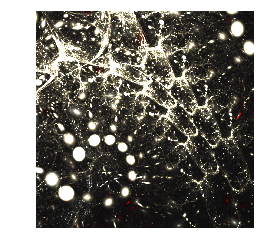

<Figure size 995x995 with 0 Axes>

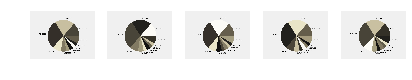

<Figure size 796x1990 with 0 Axes>

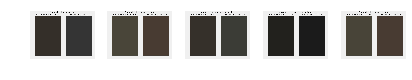

<Figure size 796x1990 with 0 Axes>

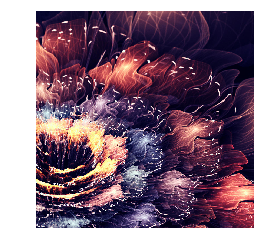

<Figure size 995x995 with 0 Axes>

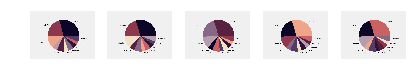

<Figure size 796x1990 with 0 Axes>

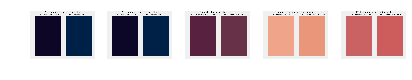

<Figure size 796x1990 with 0 Axes>

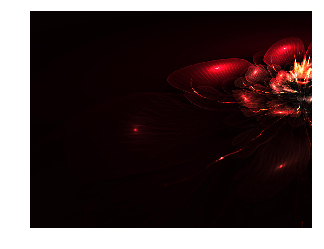

<Figure size 995x995 with 0 Axes>

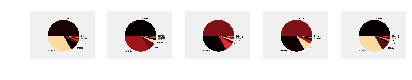

<Figure size 796x1990 with 0 Axes>

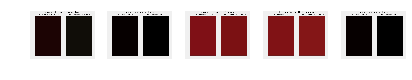

<Figure size 796x1990 with 0 Axes>

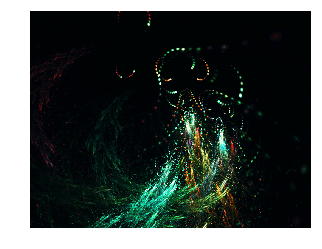

<Figure size 995x995 with 0 Axes>

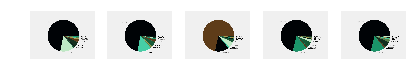

<Figure size 796x1990 with 0 Axes>

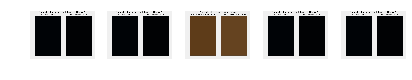

<Figure size 796x1990 with 0 Axes>

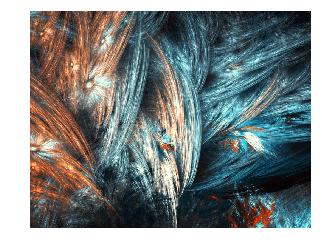

<Figure size 995x995 with 0 Axes>

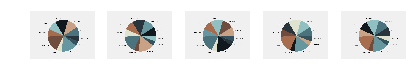

<Figure size 796x1990 with 0 Axes>

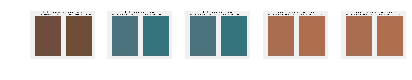

<Figure size 796x1990 with 0 Axes>

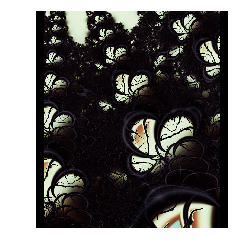

<Figure size 995x995 with 0 Axes>

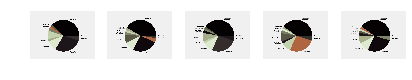

<Figure size 796x1990 with 0 Axes>

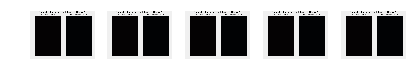

<Figure size 796x1990 with 0 Axes>

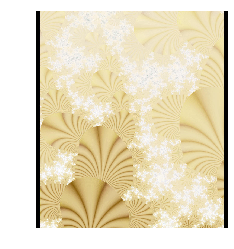

<Figure size 995x995 with 0 Axes>

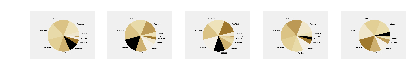

<Figure size 796x1990 with 0 Axes>

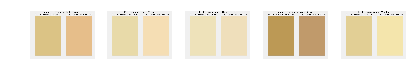

<Figure size 796x1990 with 0 Axes>

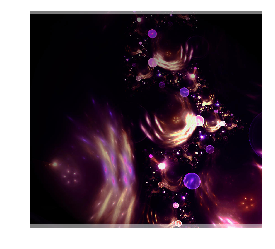

<Figure size 995x995 with 0 Axes>

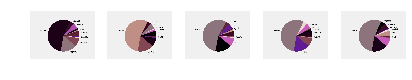

<Figure size 796x1990 with 0 Axes>

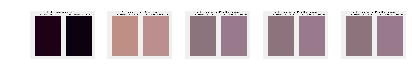

<Figure size 796x1990 with 0 Axes>

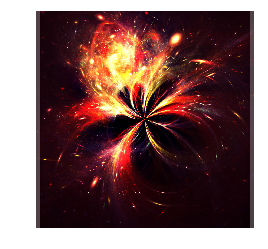

<Figure size 995x995 with 0 Axes>

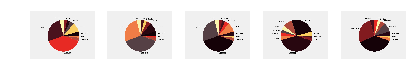

<Figure size 796x1990 with 0 Axes>

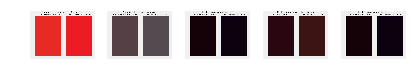

<Figure size 796x1990 with 0 Axes>

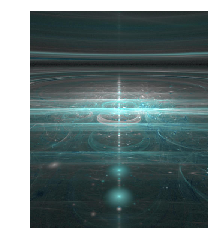

<Figure size 995x995 with 0 Axes>

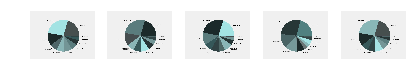

<Figure size 796x1990 with 0 Axes>

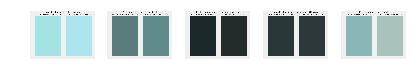

<Figure size 796x1990 with 0 Axes>

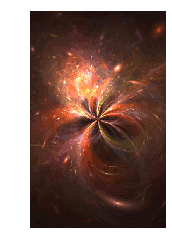

<Figure size 995x995 with 0 Axes>

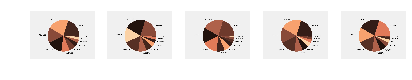

<Figure size 796x1990 with 0 Axes>

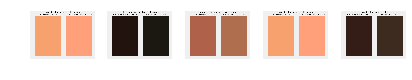

<Figure size 796x1990 with 0 Axes>

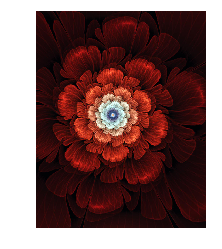

<Figure size 995x995 with 0 Axes>

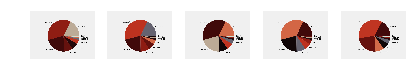

<Figure size 796x1990 with 0 Axes>

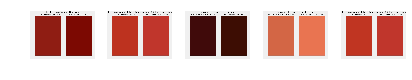

<Figure size 796x1990 with 0 Axes>

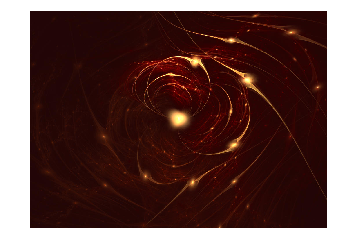

<Figure size 995x995 with 0 Axes>

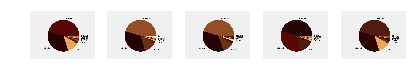

<Figure size 796x1990 with 0 Axes>

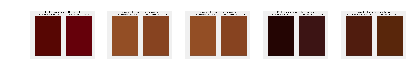

<Figure size 796x1990 with 0 Axes>

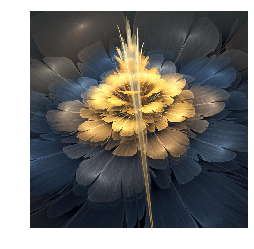

<Figure size 995x995 with 0 Axes>

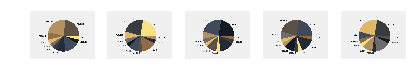

<Figure size 796x1990 with 0 Axes>

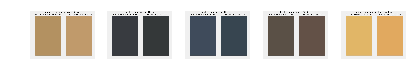

<Figure size 796x1990 with 0 Axes>

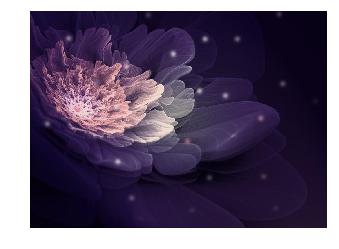

<Figure size 995x995 with 0 Axes>

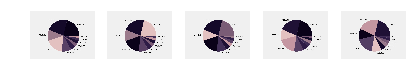

<Figure size 796x1990 with 0 Axes>

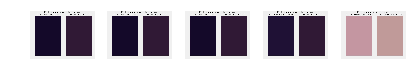

<Figure size 796x1990 with 0 Axes>

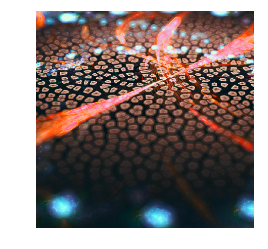

<Figure size 995x995 with 0 Axes>

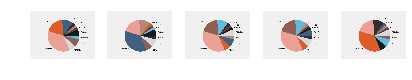

<Figure size 796x1990 with 0 Axes>

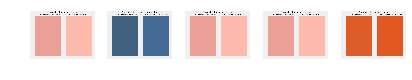

<Figure size 796x1990 with 0 Axes>

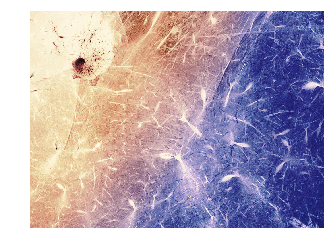

<Figure size 995x995 with 0 Axes>

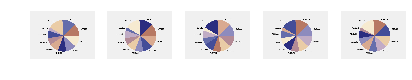

<Figure size 796x1990 with 0 Axes>

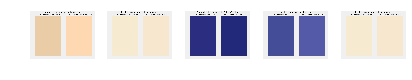

<Figure size 796x1990 with 0 Axes>

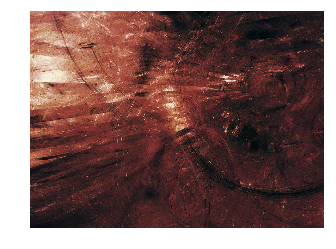

<Figure size 995x995 with 0 Axes>

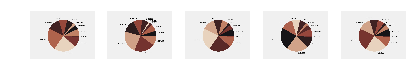

<Figure size 796x1990 with 0 Axes>

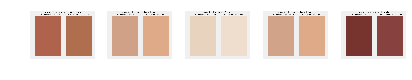

<Figure size 796x1990 with 0 Axes>

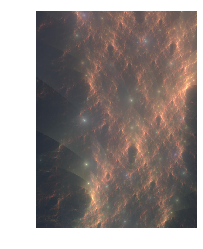

<Figure size 995x995 with 0 Axes>

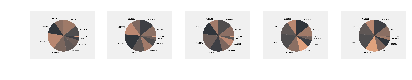

<Figure size 796x1990 with 0 Axes>

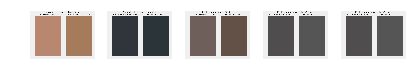

<Figure size 796x1990 with 0 Axes>

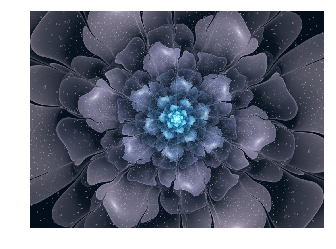

<Figure size 995x995 with 0 Axes>

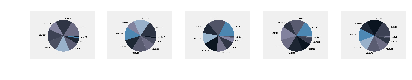

<Figure size 796x1990 with 0 Axes>

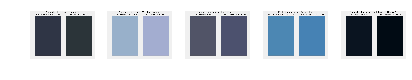

<Figure size 796x1990 with 0 Axes>

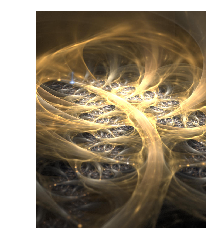

<Figure size 995x995 with 0 Axes>

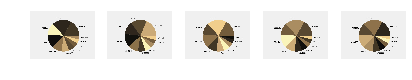

<Figure size 796x1990 with 0 Axes>

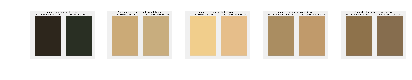

<Figure size 796x1990 with 0 Axes>

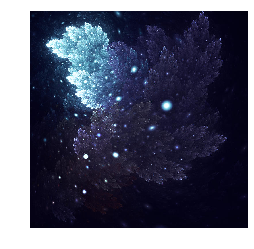

<Figure size 995x995 with 0 Axes>

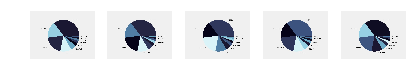

<Figure size 796x1990 with 0 Axes>

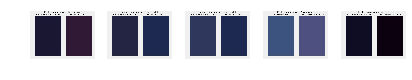

<Figure size 796x1990 with 0 Axes>

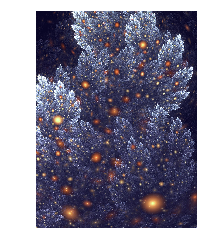

<Figure size 995x995 with 0 Axes>

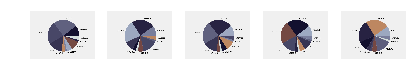

<Figure size 796x1990 with 0 Axes>

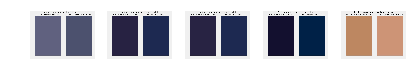

<Figure size 796x1990 with 0 Axes>

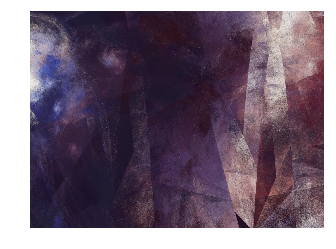

<Figure size 995x995 with 0 Axes>

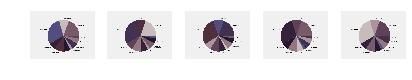

<Figure size 796x1990 with 0 Axes>

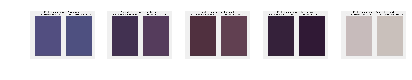

<Figure size 796x1990 with 0 Axes>

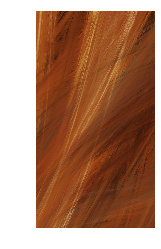

<Figure size 995x995 with 0 Axes>

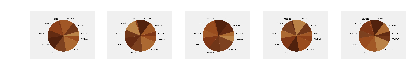

<Figure size 796x1990 with 0 Axes>

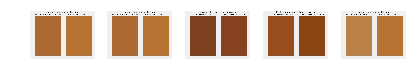

<Figure size 796x1990 with 0 Axes>

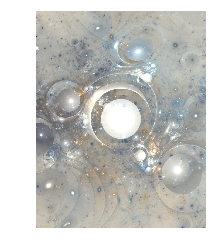

<Figure size 995x995 with 0 Axes>

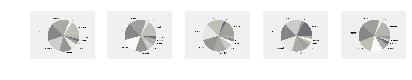

<Figure size 796x1990 with 0 Axes>

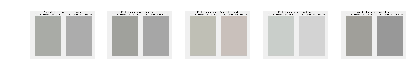

<Figure size 796x1990 with 0 Axes>

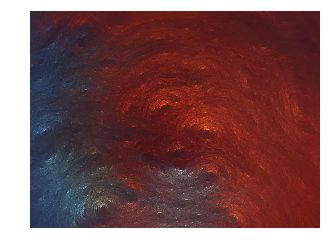

<Figure size 995x995 with 0 Axes>

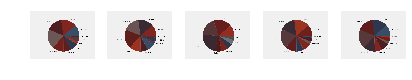

<Figure size 796x1990 with 0 Axes>

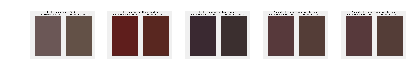

<Figure size 796x1990 with 0 Axes>

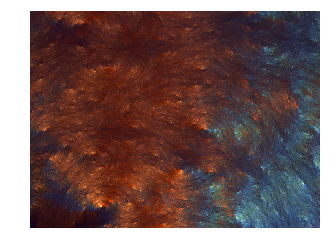

<Figure size 995x995 with 0 Axes>

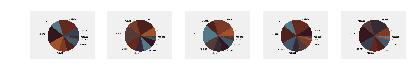

<Figure size 796x1990 with 0 Axes>

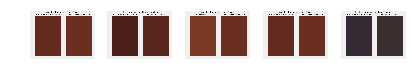

<Figure size 796x1990 with 0 Axes>

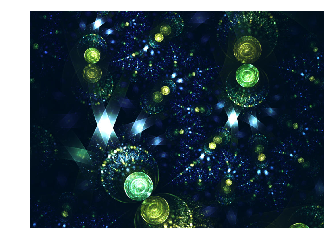

<Figure size 995x995 with 0 Axes>

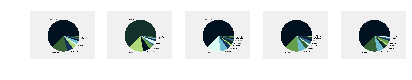

<Figure size 796x1990 with 0 Axes>

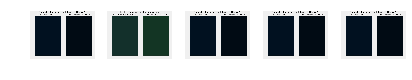

<Figure size 796x1990 with 0 Axes>

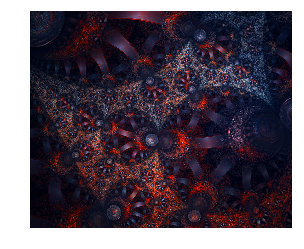

<Figure size 995x995 with 0 Axes>

KeyboardInterrupt: 

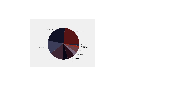

In [5]:
def get_image(image_path):
    image = cv2.imread(image_path)
    # By default, OpenCV reads image sequence as BGR
    # To view the actual image we need to convert
    # to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

c = 0
for filename in os.listdir("./data"):
    if filename.endswith(".jpg"):
        image = get_image(f'./data/{filename}')
        
        fname = str(c) + ".jpg"
        c += 1
        
        first_pie = get_image(f'./data_runs/first/piecharts/{fname}')
        second_pie = get_image(f'./data_runs/second/piecharts/{fname}')
        third_pie = get_image(f'./data_runs/third/piecharts/{fname}')
        fourth_pie = get_image(f'./data_runs/fourth/piecharts/{fname}')
        fifth_pie = get_image(f'./data_runs/fifth/piecharts/{fname}')
        
        first_peak = get_image(f'./data_runs/first/peaks/{fname}')
        second_peak = get_image(f'./data_runs/second/peaks/{fname}')
        third_peak = get_image(f'./data_runs/third/peaks/{fname}')
        fourth_peak = get_image(f'./data_runs/fourth/peaks/{fname}')
        fifth_peak = get_image(f'./data_runs/fifth/peaks/{fname}')
        
        pie_images = [first_pie, second_pie, third_pie, fourth_pie, fifth_pie]
        peak_images = [first_peak, second_peak, third_peak, fourth_peak, fifth_peak]
            
        fig, ax = plt.subplots()
            
        implot = ax.imshow(image)
        plt.axis('off')
        plt.grid(b=None)
        plt.figure(figsize=(5,5), dpi=199)
        plt.savefig(f"./nbimg/{filename}")
        plt.show()
        plt.close()
        
        
        for i in range(len(pie_images)):
            plt.subplot(1, len(pie_images), i+1)
            plt.axis('off')
            plt.grid(b=None)
            plt.imshow(pie_images[i])
        plt.figure(figsize=(4, 10), dpi=199)
        plt.savefig(f"./nbimg/pie-{fname}")
        plt.show()
        plt.close()
                               
        for i in range(len(peak_images)):
            plt.subplot(1, len(peak_images), i+1)
            plt.axis('off')
            plt.grid(b=None)
            plt.imshow(peak_images[i])
        plt.figure(figsize=(4, 10), dpi=199)
        plt.savefig(f"./nbimg/peak-{fname}")
        plt.show()
        plt.close()
    
        
        